In [2]:
# Global imports
import numpy as np

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
from pymongo import MongoClient

# Connect to local MongoDB database
client = MongoClient("mongodb://localhost:27017")

# Create/access feature descriptor collection
db = client["knravish_mwdb_phase_1"]
fd_collection = db["fd_collection"]


### Loading Caltech101 dataset

In [4]:
import torchvision.datasets as datasets

dataset_path = "C:\Kaushik\ASU\CSE 515 - Multimedia and Web Databases\Project\Phase 1\Datasets"

dataset = datasets.Caltech101(
    root=dataset_path,
    download=False,  # True if downloading for first time
)


In [5]:
import math


def euclidean_distance_measure(img_1_fd, img_2_fd):
    img_1_fd_reshaped = np.nan_to_num(img_1_fd.flatten())
    img_2_fd_reshaped = np.nan_to_num(img_2_fd.flatten())

    # Calculate Euclidean distance
    return math.dist(img_1_fd_reshaped, img_2_fd_reshaped)


In [6]:
def cosine_distance_measure(img_1_fd, img_2_fd):
    img_1_fd_reshaped = img_1_fd.flatten()
    img_2_fd_reshaped = img_2_fd.flatten()
    
    # Calculate dot product
    dot_product = np.dot(img_1_fd_reshaped, img_2_fd_reshaped.T)

    # Calculate magnitude (L2 norm) of the feature descriptor
    magnitude1 = np.linalg.norm(img_1_fd_reshaped)
    magnitude2 = np.linalg.norm(img_2_fd_reshaped)

    # Calculate cosine distance (similarity is higher => distance should be lower, so subtract from 1)
    cosine_similarity = (dot_product / (magnitude1 * magnitude2))
    return 1 - cosine_similarity


In [7]:
from scipy.stats import pearsonr


def pearson_distance_measure(img_1_fd, img_2_fd):
    # Replace nan with 0 (color moments)
    img_1_fd_reshaped = np.nan_to_num(img_1_fd.flatten())
    img_2_fd_reshaped = np.nan_to_num(img_2_fd.flatten())

    # Invert and scale in half to fit the actual range [-1, 1] into the new range [0, 1]
    # such that lower distance implies more similarity
    return 0.5 * (1 - pearsonr(img_1_fd_reshaped, img_2_fd_reshaped).statistic)


In [8]:
valid_feature_models = ["cm", "hog", "avgpool", "layer3", "fc"]
valid_distance_measures = {
    "euclidean": euclidean_distance_measure,
    "cosine": cosine_distance_measure,
    "pearson": pearson_distance_measure,
}


In [21]:
def show_similar_images(
    target_image_id, k, feature_model, distance_measure, save_plots=False
):
    print(
        "Showing {} similar images for image ID {}, using {} for {} feature descriptor...".format(
            k, target_image_id, distance_measure.__name__, feature_model
        )
    )

    # store target_image itself
    min_dists = {target_image_id: 0}

    # Get target image's feature descriptors
    target_image = fd_collection.find_one({"image_id": target_image_id})
    target_image_fd = np.array(target_image[feature_model + "_fd"])

    assert (
        feature_model in valid_feature_models
    ), "feature_model should be one of " + str(valid_feature_models)

    assert (
        distance_measure in valid_distance_measures.values()
    ), "distance_measure should be one of " + str(
        list(valid_distance_measures.keys())
    )

    # only RGB for non RGB images
    if feature_model is not "hog":
        all_images = fd_collection.find({"channels": 3})
    else:
        all_images = fd_collection.find()

    for cur_img in all_images:
        cur_img_id = cur_img["image_id"]
        # skip target itself
        if cur_img_id == target_image_id:
            continue
        cur_img_fd = np.array(cur_img[feature_model + "_fd"])
        cur_dist = distance_measure(
            cur_img_fd,
            target_image_fd,
        )

        # store first k images irrespective of distance (so that we store no more than k minimum distances)
        if len(min_dists) < k + 1:
            min_dists[cur_img_id] = cur_dist

        # if lower distance:
        elif cur_dist < max(min_dists.values()):
            # add to min_dists
            min_dists.update({cur_img_id: cur_dist})
            # remove greatest distance by index
            min_dists.pop(max(min_dists, key=min_dists.get))

    min_dists = dict(sorted(min_dists.items(), key=lambda item: item[1]))
    print(min_dists.items())

    fig, axs = plt.subplots(1, k+1, figsize=(32, 12))
    for idx, (img_id, distance) in enumerate(min_dists.items()):
        cur_img, _cur_label = dataset[img_id]
        axs[idx].imshow(cur_img)
        if idx == 0:
            axs[idx].set_title(f"Target image")
        else:
            axs[idx].set_title(f"Distance: {round(distance, 2)}")
        axs[idx].axis("off")

    if save_plots:
        plt.savefig(
            f"Plots/Image_{target_image_id}_{feature_model}_{distance_measure.__name__}_k{k}.png"
        )

    plt.show()


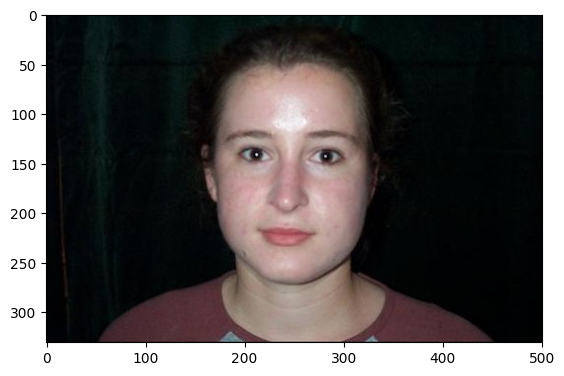

Showing 10 similar images for image ID 123, using pearson_distance_measure for cm feature descriptor...
dict_items([(123, 0), (124, 0.009492573871462018), (112, 0.012997425036510857), (120, 0.024575487622159886), (118, 0.035620867312044724), (189, 0.03933099348926289), (115, 0.04971886944656512), (350, 0.05595448394785274), (356, 0.06668975113655867), (362, 0.06957902336351268), (353, 0.07092448943506707)])


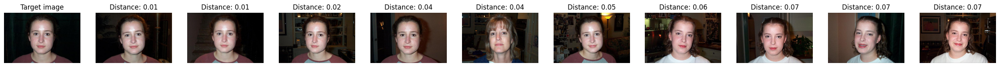

In [24]:
selected_image_id = int(input("Enter image ID: "))
sample_image, sample_label = dataset[selected_image_id]
plt.imshow(sample_image)
plt.show()

k = int(input("Enter value of k: "))
if k < 1:
    raise ValueError("k should be positive integer")

selected_feature_model = str(
    input("Enter feature model - one of " + str(valid_feature_models))
)

selected_distance_measure = valid_distance_measures[str(
    input("Enter distance measure - one of " + str(list(valid_distance_measures.keys())))
)]

show_similar_images(selected_image_id, k, selected_feature_model, selected_distance_measure, save_plots=True)


# Target images

Showing 10 similar images for image ID 0, using pearson_distance_measure for cm feature descriptor...
dict_items([(0, 0), (3196, 0.03383576858377024), (4769, 0.03424654030479257), (3165, 0.03539889443115568), (8188, 0.036716100012850694), (5160, 0.036967607505846656), (5932, 0.03713376939792079), (5949, 0.03797633667200939), (155, 0.03805722687365998), (7262, 0.03842418796176572), (677, 0.03843639747930999)])


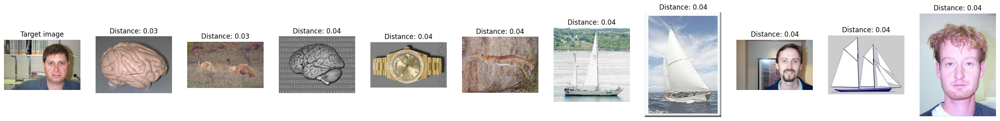

Showing 10 similar images for image ID 0, using cosine_distance_measure for hog feature descriptor...
dict_items([(0, 0), (5857, 0.37066720554636234), (7388, 0.3748422571206085), (7380, 0.3785486735918283), (50, 0.3802735431814338), (7631, 0.38081242015096983), (4758, 0.38377950954101503), (6704, 0.3867203482628291), (3010, 0.3870345455956933), (4197, 0.3875601276386982), (4195, 0.38891296844476986)])


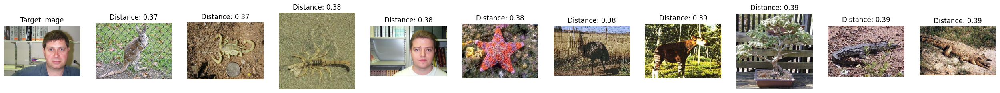

Showing 10 similar images for image ID 0, using euclidean_distance_measure for avgpool feature descriptor...
dict_items([(0, 0), (6871, 1.685871145636394), (3335, 1.711539969220787), (4445, 1.7167054207883308), (3915, 1.7381187483307057), (1643, 1.7383235364395093), (4555, 1.741429522194048), (3121, 1.74447075828923), (520, 1.7659527113167663), (1484, 1.7686747663973335), (6768, 1.7777948459697144)])


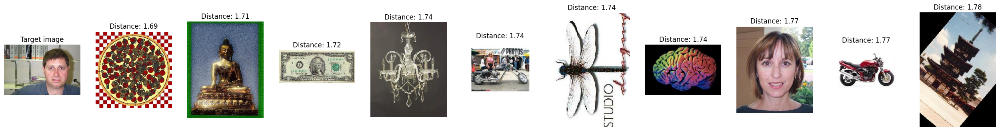

Showing 10 similar images for image ID 0, using euclidean_distance_measure for layer3 feature descriptor...
dict_items([(0, 0), (7189, 2.054606711952964), (3364, 2.0656494832615775), (3360, 2.0713577772741174), (3188, 2.0715084020500276), (8241, 2.0745365957568835), (6910, 2.0842581814653007), (7688, 2.0842683041835675), (3963, 2.090733157537167), (6163, 2.0994926982414945), (7690, 2.1002658237526464)])


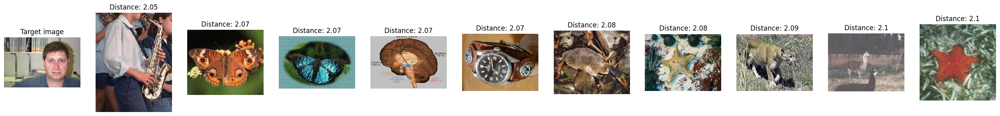

Showing 10 similar images for image ID 0, using euclidean_distance_measure for fc feature descriptor...
dict_items([(0, 0), (520, 4.680471161757578), (1767, 4.835674240409834), (4445, 4.875733683089916), (6237, 4.87752988255404), (3703, 4.920916058592386), (2080, 4.953683208566516), (6871, 4.956114773606727), (7482, 4.960673083782282), (4555, 4.9660580822215685), (1236, 5.014140836739083)])


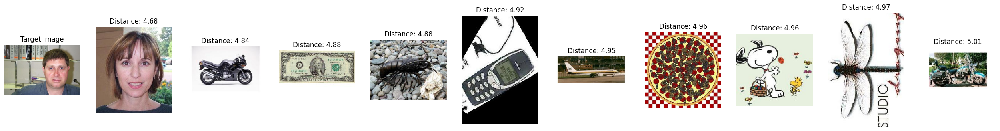

Showing 10 similar images for image ID 880, using pearson_distance_measure for cm feature descriptor...
dict_items([(880, 0), (876, 0.025901572619297097), (980, 0.0266467931410444), (976, 0.027788151712915043), (974, 0.027980209909618692), (973, 0.02830489676590986), (7406, 0.029001650075388075), (991, 0.02932923498423734), (873, 0.03029618597799516), (987, 0.030772657263332837), (1050, 0.031045651605259517)])


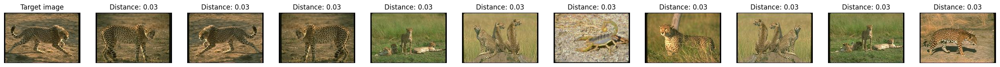

Showing 10 similar images for image ID 880, using cosine_distance_measure for hog feature descriptor...
dict_items([(880, 0), (998, 0.1217693871938732), (980, 0.12766326320790566), (898, 0.12858066740230956), (976, 0.1370127243979239), (876, 0.14243795805995507), (978, 0.14344840581581086), (875, 0.1450103102559247), (944, 0.14515282655087047), (878, 0.14760571964255165), (894, 0.14923290834303493)])


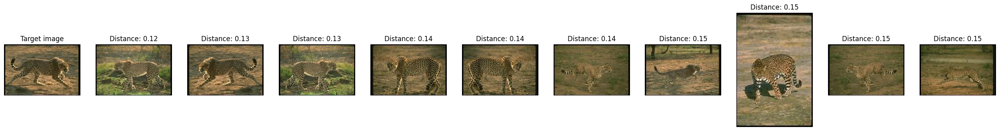

Showing 10 similar images for image ID 880, using euclidean_distance_measure for avgpool feature descriptor...
dict_items([(880, 0), (4753, 2.0100148333255308), (5215, 2.0409974589708484), (5127, 2.0441261951858456), (5643, 2.046974630432066), (3000, 2.0557022329413694), (8562, 2.055909100995621), (1753, 2.0562617427349963), (4252, 2.0581744733808573), (5385, 2.0591995889239985), (290, 2.0613740102197613)])


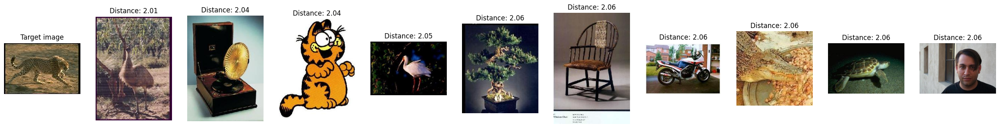

Showing 10 similar images for image ID 880, using euclidean_distance_measure for layer3 feature descriptor...
dict_items([(880, 0), (3233, 1.9837886287255382), (897, 1.9996723124778017), (932, 2.0086919090583364), (981, 2.0112729580988478), (8504, 2.0202807067003423), (993, 2.0307009366304163), (893, 2.041740488745179), (3795, 2.0557828794562414), (918, 2.055988732157177), (923, 2.0619130483181496)])


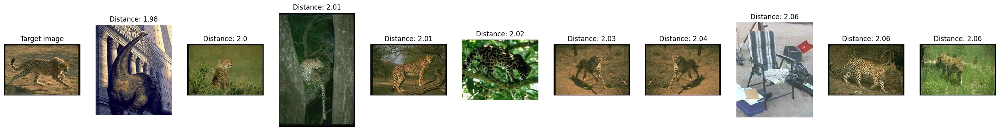

Showing 10 similar images for image ID 880, using euclidean_distance_measure for fc feature descriptor...
dict_items([(880, 0), (956, 5.21429897336088), (4753, 5.34666139571686), (3121, 5.444654722369442), (1484, 5.515036688636357), (4081, 5.533470145408321), (5786, 5.557728909218183), (4551, 5.558052786651275), (5502, 5.5682100264987655), (3335, 5.570968123895357), (3678, 5.5854867351916)])


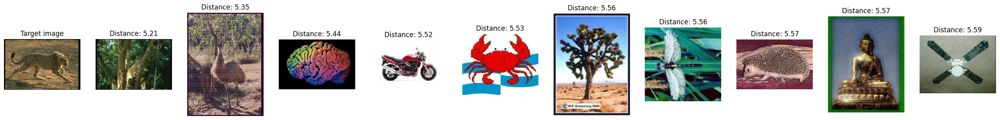

Showing 10 similar images for image ID 2500, using pearson_distance_measure for cm feature descriptor...
dict_items([(2500, 0), (2406, 0.011887250336379496), (2519, 0.012015933194295891), (2624, 0.01204222885104339), (2301, 0.012225109021648028), (2569, 0.01251733868215138), (2299, 0.013869306802454962), (4503, 0.013936255187696145), (5007, 0.013941822074706012), (2214, 0.014184929202169072), (2245, 0.014867269137268546)])


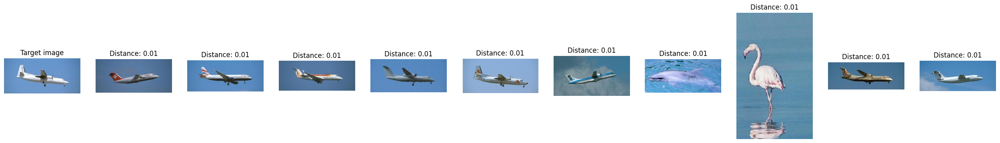

Showing 10 similar images for image ID 2500, using cosine_distance_measure for hog feature descriptor...
dict_items([(2500, 0), (2308, 0.2100408003782438), (2121, 0.2533284200227047), (2094, 0.2559034168533275), (2214, 0.2657970083166479), (2231, 0.28093814226196556), (2191, 0.2890483136183585), (2413, 0.29890086900558765), (2301, 0.3032783935424721), (2200, 0.3078966191018041), (2632, 0.3086243232312643)])


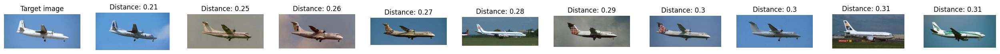

Showing 10 similar images for image ID 2500, using euclidean_distance_measure for avgpool feature descriptor...
dict_items([(2500, 0), (7786, 2.098891515875061), (4700, 2.112399342053247), (1891, 2.119209691342185), (4217, 2.1236725359478905), (767, 2.1256395433573627), (395, 2.1261417904007933), (4179, 2.1283780923963187), (6523, 2.1294125789930205), (2211, 2.1312982288397038), (7648, 2.132801967077353)])


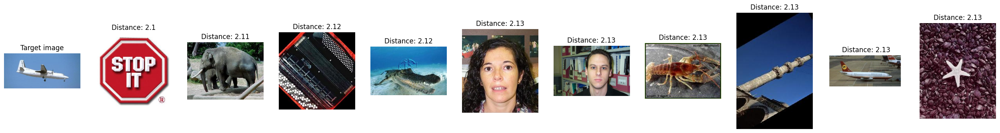

Showing 10 similar images for image ID 2500, using euclidean_distance_measure for layer3 feature descriptor...
dict_items([(2500, 0), (2218, 2.1011202806077294), (2308, 2.116431356971186), (3098, 2.171451192711611), (2363, 2.171649460474934), (2231, 2.1834718498200125), (3657, 2.1921654332349796), (2486, 2.198223496032716), (1927, 2.201743976876914), (5655, 2.2025979454030864), (2253, 2.2040337187122256)])


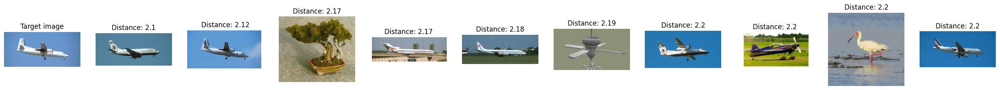

Showing 10 similar images for image ID 2500, using euclidean_distance_measure for fc feature descriptor...
dict_items([(2500, 0), (2627, 6.023384477308827), (7490, 6.069406079997301), (1817, 6.069585513675632), (2069, 6.103045518225542), (594, 6.105183846584818), (5286, 6.129824794987366), (6858, 6.155998956232678), (5463, 6.158086431451258), (7415, 6.172142220569311), (1063, 6.180014190418164)])


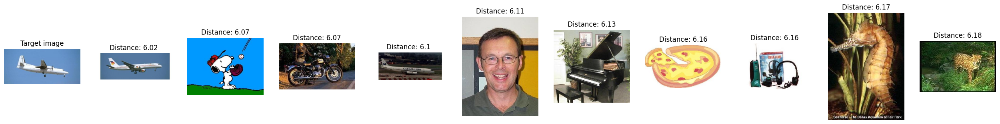

Showing 10 similar images for image ID 5122, using cosine_distance_measure for hog feature descriptor...
dict_items([(5122, 0), (5477, 0.3024191490811665), (7616, 0.3107359339738195), (7467, 0.3177246722277909), (5855, 0.3246635352050734), (7706, 0.3280547853013397), (5803, 0.3284573212984735), (8649, 0.32978130979376596), (5051, 0.33039991547269065), (6871, 0.3310933727028782), (5757, 0.3317737034030588)])


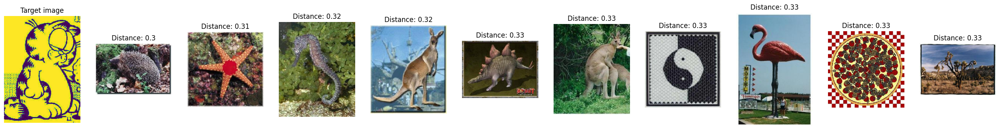

Showing 10 similar images for image ID 8676, using cosine_distance_measure for hog feature descriptor...
dict_items([(8676, 0), (8643, 0.23952314085215953), (8620, 0.31764759301556056), (8644, 0.3248592892679786), (8658, 0.33813675983707336), (8623, 0.3766008364074247), (8640, 0.38614661071164824), (5166, 0.4001396677847908), (8667, 0.4079044954493871), (8635, 0.42009166342668725), (8654, 0.4413248530593945)])


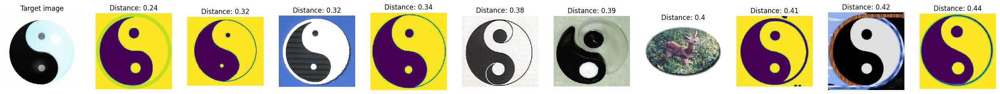

In [22]:
rgb_query_target_image_ids = [0, 880, 2500]
grayscale_query_target_image_ids = [5122, 8676]

for image_id in rgb_query_target_image_ids:
    # PCC for color moments
    show_similar_images(
        image_id, 10, "cm", valid_distance_measures["pearson"], save_plots=True
    )
    # Cosine similarity for HOG
    show_similar_images(
        image_id, 10, "hog", valid_distance_measures["cosine"], save_plots=True
    )
    # Euclidean for all ResNet features
    show_similar_images(
        image_id, 10, "avgpool", valid_distance_measures["euclidean"], save_plots=True
    )
    show_similar_images(
        image_id, 10, "layer3", valid_distance_measures["euclidean"], save_plots=True
    )
    show_similar_images(
        image_id, 10, "fc", valid_distance_measures["euclidean"], save_plots=True
    )

for image_id in grayscale_query_target_image_ids:
    # Only HOG, so just cosine
    show_similar_images(
        image_id, 10, "hog", valid_distance_measures["cosine"], save_plots=True
    )
